# Analyse des données pour former des hypothèses et orienter le choix de modèle

### 1. Expertise sur les données 

1. **Distribution de la cible supérieure à 0.551446 et inférieure à 18.406403.**  
   -> Clipping artificiel après la synthèse, introduction de forte non-linéarité.

2. **Corrélations :**  
   - **Forte Corrélation :** X8 <-> X1 et X6 <-> X0  
   - **Corrélation Modérée :** 0<->8<->6, 1<->2<->4<->6, 2<->5, 3<->5<->7, 5<->8, 7<->9  
   - **Faible corrélation entre la cible et les variables**
   - **Pas de motif périodique donc une transformation en ondelette ne semble pas une approche prometteuse.**

3. **Fréquences et autocorrélations n'ont pas abouti.**  
   -> Suggère que la saisonnalité/périodicité n'est pas évidente.

4. **Composantes principales :**  
   - 3 CP > 15% après PCA  
   - Pas de clusters après projections sur 2 CP  
   - PC1: X0, X8, X1, X6 ont les plus gros coefficients (>0.3)
     
   -> **PCA ne permet pas d'expliquer la variance simplement, travailler avec les moments statistiques n'est pas prometteur.**

5. **Clustering**
   - Pas de cluster identifiable avec K-Means 3,5,7.



### But: Investiguer la distribution de données à prédire

* Pas de tendances d'évolution temporelle  de la distribution cible

## 2. Détermination des hypothèses de travail
- Hypothèse:  
  - **Échantillons {$\mathbf{X}_i$} sont indépendants à courte et longue distance**  
  - **Forte non linéarité**
  - **Réduction de dimension non efficace**
  - **la cible n'est pas une série temporelle**

- Ingénierie des variables:
  - Utilisation des données telles quelles



## 3. Choix de modèles

* baseline XGBoost: Performances avec des non-linéarité
* MLP: Modèle plus profond pour capturer des relations plus complexes
    - 9729  ok
    - 625  ok
    - 119  X

## 4. Résultats
* baseline XGBoost: Limitations
-> Ne parvient pas à prédire la tail de la distribution

* MLP: Parvient à capturer l'ensemble de la distribution avec faible mse par rapport au XGBoost
    - 9729  ok
    - 625  ok
    - 119  X

## 5. Discussion
Découverte et questionnement:
D'où proviennent les données générées?
Quelle méthode de feature engineering aurait pu aider à trouver un modèle plus petit et performant?

Découverte:
Les plus petits modèles ont du mal à générer la tail de la distribution. 

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [4]:
path_regression_data = r'regression.csv'
table_df = pd.read_csv(path_regression_data)
target = table_df['Y']
data_df = table_df.drop('Y', axis=1)

In [5]:
from matplotlib.colors import LinearSegmentedColormap
colors = ['#24E3EA', '#1DD5D5', '#37BBBF', '#339C9F', '#03045e']
cmap = LinearSegmentedColormap.from_list('custom_cmap', colors, N=10)

gradient_colors = [cmap(i / 9) for i in range(10)]

## 1.1 Analyse rapide des données

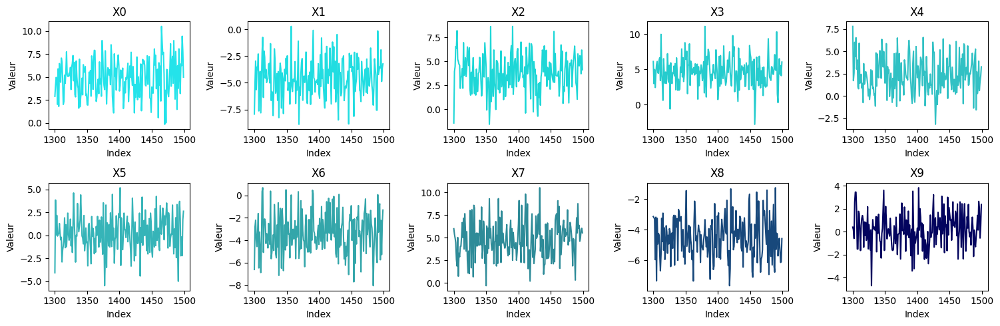

In [6]:
fig, axes = plt.subplots(2, 5, figsize=(15, 5))
axes = axes.flatten()
for i, (col, ax) in enumerate(zip(data_df.columns, axes)):
    data_df[col].iloc[1300:1500].plot(ax=ax, title=col, color=gradient_colors[i])
    ax.set_xlabel('Index')
    ax.set_ylabel('Valeur')

plt.tight_layout()
plt.show()

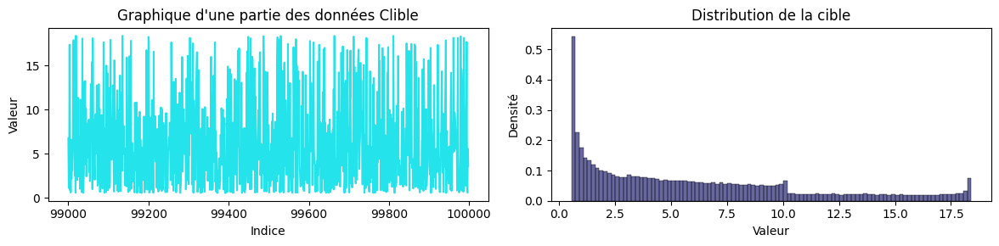

Distribution de la cible supérieur à 0.551446 et inférieur à 18.406403. Ressembler à un clipping.


In [15]:
import seaborn as sns
fig, ax = plt.subplots(1, 2, figsize=(12, 3))
selected_data=target

ax[0].plot(target.iloc[99000:99999], color=colors[0])
ax[0].set_title(f'Graphique d\'une partie des données Clible')
ax[0].set_xlabel('Indice')
ax[0].set_ylabel('Valeur')

sns.histplot(selected_data, bins=100, kde=False, color=colors[4], edgecolor='black', stat='density', alpha=0.6, ax=ax[1])
ax[1].set_title('Distribution de la cible')
ax[1].set_xlabel('Valeur')
ax[1].set_ylabel('Densité')

plt.tight_layout()
plt.show()

print(f'Distribution de la cible supérieur à {np.min(target)} et inférieur à {np.max(target)}. Ressembler à un clipping.')

## 1.2 Approfondissement des statistiques et corrélations

   - **Forte Corrélation :** X8 <-> X1 et X6 <-> X0  
   - **Corrélation Modérée :** 0<->8<->6, 1<->2<->4<->6, 2<->5, 3<->5<->7, 5<->8, 7<->9  
   - **Faible corrélation entre la cible et les variables**

In [18]:
from ydata_profiling import ProfileReport

profile = ProfileReport(table_df, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 1.3 Exploration de tendances temporelles
### 1.3.1 Évolution de la densité cible au fil des échantillons
Voir la vidéo

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import cv2
import os
import imageio

if not os.path.exists('frames'):
    os.makedirs('frames')


for i in range(0, len(target), 1000):  
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))

    sns.histplot(target, bins=100, kde=False, color='red', edgecolor='black', stat='density', alpha=0.6, ax=ax[0], label='Target density')
    ax[0].set_title('Histogram of val set')
    ax[0].set_xlabel('Index')
    ax[0].set_ylabel('Value')
    ax[0].legend()

    sns.histplot(target, bins=100, kde=False, color='red', edgecolor='black', stat='density', alpha=0.6, ax=ax[0], label='Target density')
    sns.histplot(target[i:i+10000], bins=100, kde=False, color='yellow', edgecolor='black', stat='density', alpha=0.6, ax=ax[1], label=f'Target [{i}:{i+10000}]')
    ax[1].set_title('Histogram of Test set')
    ax[1].set_xlabel('Value')
    ax[1].set_ylabel('Density')
    ax[1].legend()

    plt.tight_layout()

    plt.savefig(f'frames/frame_{i//1000:04d}.png')
    plt.close(fig)

# frame_array = []
# frames = sorted(os.listdir('frames'), key=lambda x: int(x.split('_')[1].split('.')[0]))
# for frame in frames:
#     img = cv2.imread(os.path.join('frames', frame))
#     height, width, layers = img.shape
#     size = (width, height)
#     frame_array.append(img)

# # Video creation
# out = cv2.VideoWriter('histogram_evolution.mp4', cv2.VideoWriter_fourcc(*'mp4v'), 10, size)

# for i in range(len(frame_array)):
#     out.write(frame_array[i])

# out.release()

# # Clean up the frames
# for frame in frames:
#     os.remove(os.path.join('frames', frame))

# print("Video created successfully!")

frames = sorted(os.listdir('frames'), key=lambda x: int(x.split('_')[1].split('.')[0]))
with imageio.get_writer('histogram_evolution.gif', mode='I', duration=0.1) as writer:
    for frame in frames:
        image = imageio.imread(os.path.join('frames', frame))
        writer.append_data(image)

# Clean up the frames
for frame in frames:
    os.remove(os.path.join('frames', frame))

print("GIF created successfully!")


C:\Users\lud44009\AppData\Local\Temp\ipykernel_18792\1738705819.py:58: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(os.path.join('frames', frame))


GIF created successfully!


100%|██████████| 100000/100000 [00:10<00:00, 9146.79it/s]


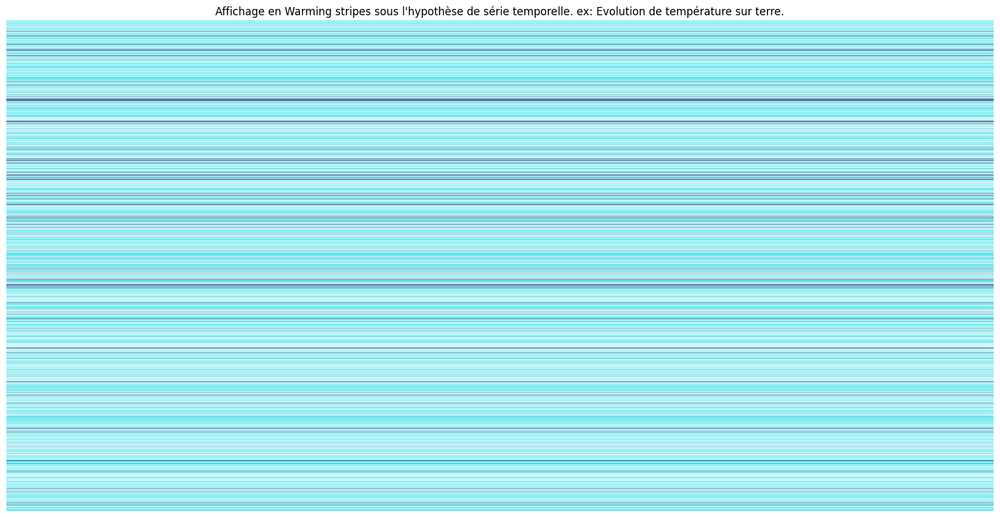

In [14]:
from tqdm import tqdm

norm_table_df=table_df
norm_data_df = norm_table_df.drop('Y', axis=1)
norm_y_df = norm_table_df[['Y']]
repeated_y_df = pd.concat([norm_y_df] * 10, axis=1)

combined_df = pd.concat([norm_data_df]  + [repeated_y_df], axis=1)
yellow_mask = norm_y_df['Y'] < 2
blue_mask = (norm_y_df['Y'] >= 10)&(norm_y_df['Y'] < 11)
red_mask = norm_y_df['Y'] > 17

plt.figure(figsize=(20, 10))
plt.imshow(combined_df, aspect='auto', cmap='viridis')

for idx in tqdm(norm_y_df.index):
    if yellow_mask[idx]:
        plt.axhline(y=idx, color=colors[0], linewidth=2)
    if blue_mask[idx]:
        plt.axhline(y=idx, color='white', linewidth=3, alpha=0.2)
    if red_mask[idx]:
        plt.axhline(y=idx, color=colors[4], linewidth=2)

plt.title('Affichage en Warming stripes sous l\'hypothèse de série temporelle. ex: Evolution de température sur terre.')
plt.axis('off')
plt.show()

### Exploration des données: Saisonanlité et périodicité 
* Fréquences et autocorrélations n'ont pas abouti.  
  -> Suggère que la sésonalité / périodicité n'est pas évidente 


### Les données à prédire proviennent-elles d'une série temporelle?

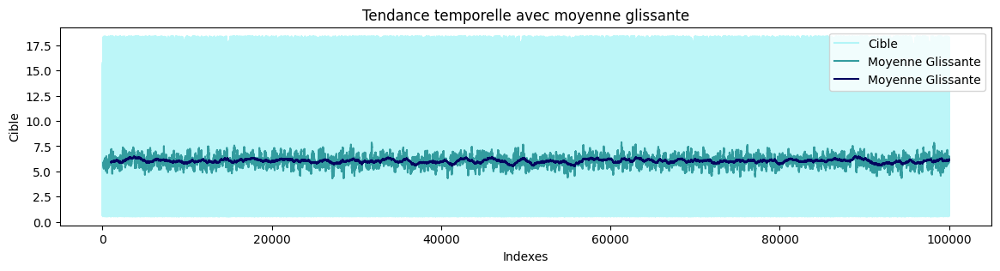

In [80]:
# Deux choix de moyenne glissante: petite et moyenne temporalité

window_size_0 = 100  
rolling_mean_0 = target.rolling(window=window_size_0).mean()

window_size_1 = 1000  
rolling_mean_1 = target.rolling(window=window_size_1).mean()

plt.figure(figsize=(14, 3))
plt.plot(target, label='Cible',color=colors[0], alpha=0.3)
plt.plot(rolling_mean_0, label='Moyenne Glissante', color=colors[3])
plt.plot(rolling_mean_1, label='Moyenne Glissante', color=colors[4])
plt.xlabel('Indexes')
plt.ylabel('Cible')
plt.title('Tendance temporelle avec moyenne glissante')
plt.legend()
plt.show()

## Dimensionalité

In [52]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_data = scaler.fit_transform(data_df)

pca = PCA(10) 
pca.fit(scaled_data)
pca_data = pca.transform(scaled_data)

pca_df = pd.DataFrame(pca_data, columns=[f'PC{i+1}' for i in range(pca_data.shape[1])])

explained_variance = pca.explained_variance_ratio_
explained_variance

array([2.38599025e-01, 2.02025470e-01, 1.60780082e-01, 1.42678663e-01,
       1.06952115e-01, 6.61064497e-02, 4.42193141e-02, 2.93900609e-02,
       9.24880856e-03, 1.23447193e-08])

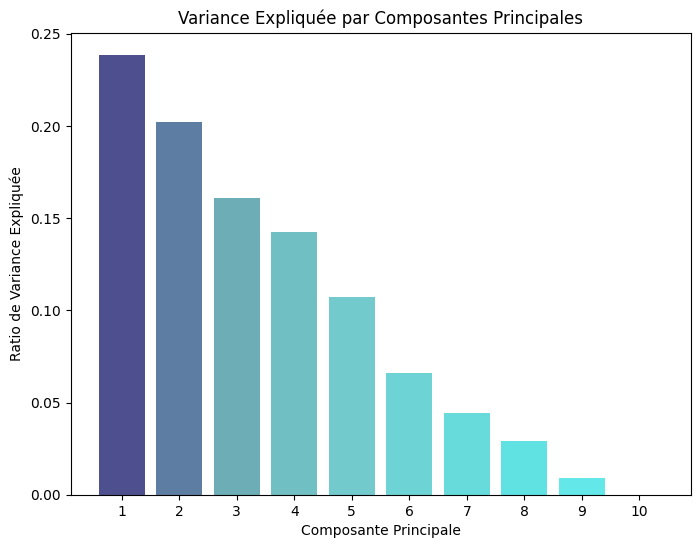

  Feature  PC1 Coefficient
6      X6        -0.520959
1      X1        -0.487999
8      X8        -0.346095
0      X0         0.310321
7      X7        -0.265742
2      X2        -0.242888
3      X3         0.228072
4      X4         0.226235
5      X5        -0.193322
9      X9        -0.064753


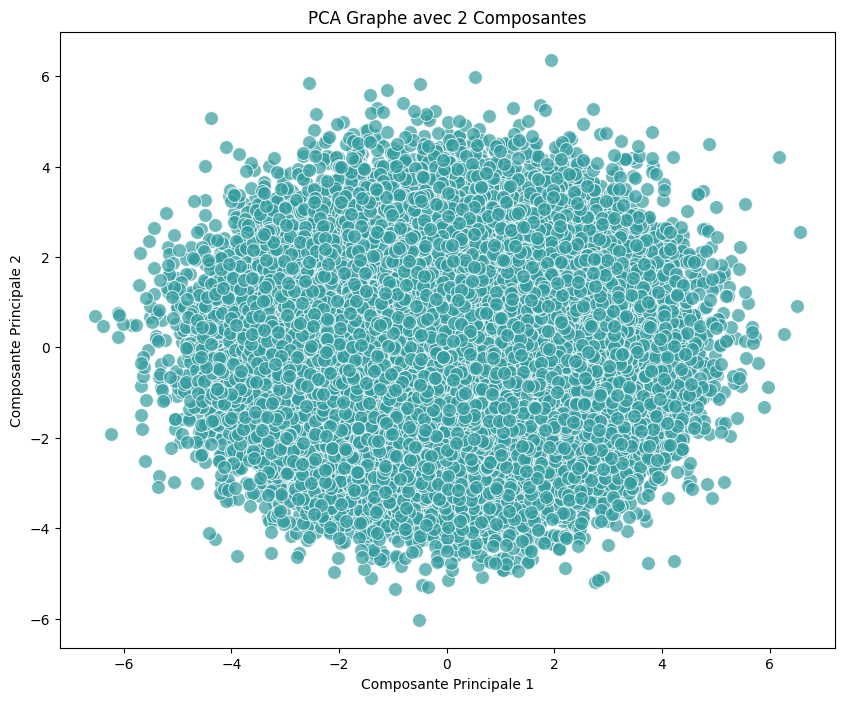

In [67]:
bar_colors = [cmap(1- i / (len(explained_variance) - 1)) for i in range(len(explained_variance))]

# Histogramme de variance expliquée
plt.figure(figsize=(8, 6))
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.7, color=bar_colors)
plt.xlabel('Composante Principale')
plt.ylabel('Ratio de Variance Expliquée')
plt.title('Variance Expliquée par Composantes Principales')
plt.xticks(range(1, len(explained_variance) + 1))
plt.show()

# Affichage de la Composante Principale 1 et des poids associés
pc1_coefficients = pca.components_[0]
pc1_df = pd.DataFrame({
    'Feature': data_df.columns,
    'PC1 Coefficient': pc1_coefficients
})

pc1_df = pc1_df.reindex(pc1_df['PC1 Coefficient'].abs().sort_values(ascending=False).index)
print(pc1_df)

# Projection sur 2 Dimensions, afficahge du scatter plot pour identification de clusters de variance maximum
pca_2 = PCA(n_components=2)
pca_data_2 = pca_2.fit_transform(scaled_data)
pca_df_2 = pd.DataFrame(pca_data_2, columns=['PC1', 'PC2'])

plt.figure(figsize=(10, 8))
sns.scatterplot(x='PC1', y='PC2',  data=pca_df_2, s=100, alpha=0.7, color=colors[3])
plt.title('PCA Graphe avec 2 Composantes')
plt.xlabel('Composante Principale 1')
plt.ylabel('Composante Principale 2')
plt.show()

# Prediction de Y: Regression

Soit $\mathbf{X} = (X_0, X_1, \dots, X_9)$ un vecteur de variables explicatives et $Y$ une variable que l'on souhaite prédire. Nous cherchons à trouver un modèle tel que : $R(X) = Y$.

D'apr`s l'analyse des données, je suppose que les $\mathbf{X}$ sont indépendantes.

In [4]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score


# Besoin de mélanger les rows? Pas de dépendances temporelles a priori
X_train_val, X_test, y_train_val, y_test = train_test_split(data_df.values, target.values, train_size=0.8, test_size=0.2, random_state=1, shuffle=True)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, train_size=0.8, test_size=0.2, random_state=1, shuffle=True)

| Model Type          | Train MSE | Val MSE  | Test MSE |
|:-------------------:|:-------------:|:-----------:|:------------:|
| Linear Regression   | 18.20     | 18.22    | 17.92    |
| Ridge Regression    | 18.20     | 18.22    | 17.92    |
| Lasso Regression    | 18.21     | 18.24    | 17.93    |
| XGBOOST             | 0.0563    | 0.0212   | 0.1598   |
| MLP (10k params)    | 7.942e-06 | **2.467e-05\***| 3.064e-05|
| MLP (1k params)     | 6.843e-06 | 3.007e-05| 2.093e-05|
| MLP (100 params)    | 8.413e-05 | 2.882e-04| 2.811e-04|


## Linear Regression

In [23]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import numpy as np
from tqdm import tqdm
from sklearn.model_selection import KFold
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso

linear_model = LinearRegression()
lasso_model = Lasso(alpha=0.1) # Hyperparameter tuned with grid search on alpha in 0.1 - 100
ridge_model = Ridge(alpha=100) # Hyperparameter tuned with grid search on alpha in 0.1 - 100


kf = KFold(n_splits=5, shuffle=True, random_state=1)

mse_scores_LR = []
mse_scores_ridge = []
mse_scores_lasso = []

for train_index, val_index in tqdm(kf.split(X_train_val), desc='Training', total=kf.get_n_splits()):
    X_train_fold, X_val_fold = X_train_val[train_index], X_train_val[val_index]
    y_train_fold, y_val_fold = y_train_val[train_index], y_train_val[val_index]
    
    
    #Linear Regression
    linear_model.fit(X_train_fold, y_train_fold)
    y_pred_LR = linear_model.predict(X_val_fold)
    mse_ridge_LR = mean_squared_error(y_val_fold, y_pred_LR)
    mse_scores_LR.append(mse_ridge_LR)
    # Ridge regression
    ridge_model.fit(X_train_fold, y_train_fold)
    y_pred_ridge = ridge_model.predict(X_val_fold)
    mse_ridge = mean_squared_error(y_val_fold, y_pred_ridge)
    mse_scores_ridge.append(mse_ridge)
    # Lasso Regression
    lasso_model.fit(X_train_fold, y_train_fold)
    y_pred_lasso = lasso_model.predict(X_val_fold)
    mse_lasso  = mean_squared_error(y_val_fold, y_pred_lasso )
    mse_scores_lasso .append(mse_lasso )


y_pred_train_LR = linear_model.predict(X_train)
y_pred_train_ridge = ridge_model.predict(X_train)
y_pred_train_lasso = lasso_model.predict(X_train)

y_pred_test_LR = linear_model.predict(X_test)
y_pred_test_ridge = ridge_model.predict(X_test)
y_pred_test_lasso = lasso_model.predict(X_test)

average_mse_LR_train = mean_squared_error(y_train, y_pred_train_LR )
average_mse_ridge_train = mean_squared_error(y_train, y_pred_train_ridge )
average_mse_lasso_train = mean_squared_error(y_train, y_pred_train_lasso )

average_mse_LR_val = np.mean(mse_scores_LR)
average_mse_ridge_val = np.mean(mse_scores_ridge)
average_mse_lasso_val = np.mean(mse_scores_lasso)

average_mse_LR_test = mean_squared_error(y_test, y_pred_test_LR )
average_mse_ridge_test = mean_squared_error(y_test, y_pred_test_ridge )
average_mse_lasso_test = mean_squared_error(y_test, y_pred_test_lasso )

print(f'Linear Regression: Average Mean Squared Error Train: {average_mse_LR_train:.4f}')
print(f'Linear Regression: Average Mean Squared Error Val: {average_mse_LR_val:.4f}')
print(f'Linear Regression: Average Mean Squared Error Test: {average_mse_LR_test:.4f}')
print('\n')
print(f'Ridge Regression: Average Mean Squared Error Train: {average_mse_ridge_train:.4f}')
print(f'Ridge Regression: Average Mean Squared Error Val: {average_mse_ridge_val:.4f}')
print(f'Ridge Regression: Average Mean Squared Error Test: {average_mse_ridge_test:.4f}')
print('\n')
print(f'Lasso Regression: Average Mean Squared Error Train: {average_mse_lasso_train:.4f}')
print(f'Lasso Regression: Average Mean Squared Error Val: {average_mse_lasso_val:.4f}')
print(f'Lasso Regression: Average Mean Squared Error Test: {average_mse_lasso_test:.4f}')


Training: 100%|██████████| 5/5 [00:01<00:00,  4.72it/s]

Linear Regression: Average Mean Squared Error Train: 18.1965
Linear Regression: Average Mean Squared Error Val: 18.2198
Linear Regression: Average Mean Squared Error Test: 17.9158


Ridge Regression: Average Mean Squared Error Train: 18.1962
Ridge Regression: Average Mean Squared Error Val: 18.2197
Ridge Regression: Average Mean Squared Error Test: 17.9154


Lasso Regression: Average Mean Squared Error Train: 18.2137
Lasso Regression: Average Mean Squared Error Val: 18.2352
Lasso Regression: Average Mean Squared Error Test: 17.9341


Performances faibles avec un modèle linéaire. Complexification du modèle avec arbre de décision, XGBoost.

## XGBoost

### Grid search on parameters

In [ ]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV, KFold
import numpy as np

params_best_1 = {
    'objective': 'reg:squarederror',
    'colsample_bytree': 0.7,           
    'gamma': 0,                        
    'learning_rate': 0.01,             
    'max_depth': 13,                   
    'min_child_weight': 3,             
    'n_estimators': 10000,             
    'subsample': 0.7,                  

}
param_grid = {
    'n_estimators': [1000,  10000],
    'learning_rate': [0.01, 0.1],
    'max_depth': [7, 13],
    'min_child_weight': [3, 5],
    'colsample_bytree': [0.7],
    'subsample': [0.7],
    'gamma': [0],
}

# Initialize the XGBRegressor
xgb_model = XGBRegressor(objective='reg:squarederror', random_state=42)

# Define KFold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',  # Use 'neg_mean_squared_error' because GridSearchCV expects a metric where higher is better
    cv=kf,
    n_jobs=-1,  # Use all available cores
    verbose=1  # Display progress
)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Best parameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

# Best validation MSE
best_mse = -grid_search.best_score_  # Convert from negative MSE to positive

print("Best Parameters:", best_params)
print(f"Best Validation MSE: {best_mse:.4f}")

# Evaluate the best model on the test set
y_test_pred = best_model.predict(X_test)
mse_test = mean_squared_error(y_test, y_test_pred)
print(f"Test MSE: {mse_test:.4f}")


In [133]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
import numpy as np
from tqdm import tqdm
from sklearn.model_selection import KFold


param_grid = {
    'n_estimators': [1000,  10000],
    'learning_rate': [0.01, 0.1],
    'max_depth': [7, 13],
    'min_child_weight': [3, 5],
    'colsample_bytree': [0.7],
    'subsample': [0.7],
    'gamma': [0, 0.1],
}

best_mse = float('inf')
best_model = None
best_params = None

# Calculate the total number of parameter combinations
total_combinations = (len(param_grid['n_estimators']) * len(param_grid['learning_rate']) *
                      len(param_grid['max_depth']) * len(param_grid['min_child_weight']) *
                      len(param_grid['subsample']) * len(param_grid['colsample_bytree']) *
                      len(param_grid['gamma']) )

kf = KFold(n_splits=5, shuffle=True, random_state=42)
# Use tqdm to create a progress bar
with tqdm(total=total_combinations, desc="Training Progress", unit="combination") as pbar:
    # Iterate over all parameter combinations
    for n_estimators in param_grid['n_estimators']:
        for learning_rate in param_grid['learning_rate']:
            for max_depth in param_grid['max_depth']:
                for min_child_weight in param_grid['min_child_weight']:
                    for subsample in param_grid['subsample']:
                        for colsample_bytree in param_grid['colsample_bytree']:
                            for gamma in param_grid['gamma']:
                                        
                                        train_mse_list = []
                                        val_mse_list = []
                                        val_mse_clipped_list = []

                                        # Perform cross-validation
                                        for train_index, val_index in tqdm(kf.split(X_train_val)):
                                            X_tr, X_val = X_train_val[train_index], X_train_val[val_index]
                                            y_tr, y_val = y_train_val[train_index], y_train_val[val_index]
                                            
                                            xgb_model = XGBRegressor(
                                            objective='reg:squarederror',
                                            random_state=42,
                                            n_estimators=n_estimators,
                                            learning_rate=learning_rate,
                                            max_depth=max_depth,
                                            min_child_weight=min_child_weight,
                                            subsample=subsample,
                                            colsample_bytree=colsample_bytree,
                                            gamma=gamma
                                        )
                                            # Train the model on the current fold
                                            xgb_model.fit(X_tr, y_tr)
                                            
                                            # Predict on the training and validation sets
                                            y_tr_pred = xgb_model.predict(X_tr)
                                            y_val_pred = xgb_model.predict(X_val)
                                            y_val_pred_clipped = np.clip(y_val_pred, np.min(target), np.max(target))

                                            # Calculate MSE for the training and validation sets
                                            train_mse = mean_squared_error(y_tr, y_tr_pred)
                                            val_mse = mean_squared_error(y_val, y_val_pred)
                                            val_mse_clipped = mean_squared_error(y_val, y_val_pred_clipped)
                                            
                                            train_mse_list.append(train_mse)
                                            val_mse_list.append(val_mse)
                                            val_mse_clipped_list.append(val_mse_clipped)
                                            

                                        # Calculate the average MSE across the folds
                                        avg_train_mse = np.mean(train_mse_list)
                                        avg_val_mse = np.mean(val_mse_list)
                                        avg_val_mse_clipped = np.mean(val_mse_clipped_list)

                                        std_train_mse = np.std(train_mse_list)
                                        std_val_mse = np.std(val_mse_list)
                                        std_val_mse_clipped = np.std(val_mse_clipped_list)
                                        
                                        print(f'Params: {xgb_model.get_params()}')
                                        print(f'\n')
                                        print('#######################################################')
                                        print('                  PERFORMANCES                         ')
                                        print('#######################################################')
                                        print(f"Average Train MSE: {avg_train_mse:.6f}" )
                                        print(f"Average Validation MSE: {avg_val_mse:.6f}")
                                        print(f"Average Validation MSE clipped: {avg_val_mse_clipped:.6f}\n")

                                        print(f"Std Train MSE: {std_train_mse:.6f}")
                                        print(f"Std Validation MSE: {std_val_mse:.6f}")
                                        print(f"Std Validation MSE clipped: {std_val_mse_clipped:.6f}")

                                        print('#######################################################')
                                        print(f'\n')
                                        # Define the model with current parameters

                                        

                                        
                                        # Save the best model
                                        if avg_val_mse_clipped < best_mse:
                                            best_mse = avg_val_mse_clipped
                                            best_model = xgb_model
                                            best_params = xgb_model.get_params()
                                        
                                        # Update the progress bar
                                        pbar.update(1)

# Display the best parameters and their corresponding MSE
print("Best Parameters:", best_params)
print(f"Best Validation MSE clipped: {best_mse:.4f}")

# Evaluate the best model on the test set
y_test_pred = best_model.predict(X_test)
y_test_pred_clipped = np.clip(y_test_pred, np.min(target), np.max(target))
mse_test = mean_squared_error(y_test, y_test_pred)
mse_test_clipped = mean_squared_error(y_test, y_test_pred_clipped)
print(f"Test MSE: {mse_test:.4f}")
print(f"Test MSE clipped: {mse_test_clipped:.4f}")


Training Progress:   0%|          | 0/32 [00:00<?, ?combination/s]

5it [01:11, 14.37s/it]
Training Progress:   3%|▎         | 1/32 [01:11<37:07, 71.85s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.01, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': 3, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 1000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES                

5it [01:20, 16.10s/it]
Training Progress:   6%|▋         | 2/32 [02:32<38:28, 76.95s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0.1, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.01, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': 3, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 1000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES              

5it [01:57, 23.59s/it]
Training Progress:   9%|▉         | 3/32 [04:30<46:14, 95.67s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.01, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': 5, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 1000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES                

5it [02:11, 26.26s/it]
Training Progress:  12%|█▎        | 4/32 [06:41<51:13, 109.75s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0.1, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.01, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': 5, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 1000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES              

5it [07:07, 85.56s/it]
Training Progress:  16%|█▌        | 5/32 [13:49<1:41:00, 224.45s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.01, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 13, 'max_leaves': None, 'min_child_weight': 3, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 1000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES               

5it [05:41, 68.38s/it]


Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0.1, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.01, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 13, 'max_leaves': None, 'min_child_weight': 3, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 1000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES             

5it [07:27, 89.56s/it] |█▉        | 6/32 [19:31<1:54:36, 264.49s/combination]


Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.01, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 13, 'max_leaves': None, 'min_child_weight': 5, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 1000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES               

5it [08:05, 97.04s/it]%|██▏       | 7/32 [26:59<2:15:13, 324.54s/combination]
Training Progress:  25%|██▌       | 8/32 [35:05<2:30:16, 375.70s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0.1, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.01, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 13, 'max_leaves': None, 'min_child_weight': 5, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 1000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES             

5it [01:37, 19.59s/it]
Training Progress:  28%|██▊       | 9/32 [36:43<1:50:45, 288.92s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': 3, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 1000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES                 

5it [01:32, 18.56s/it]
Training Progress:  31%|███▏      | 10/32 [38:15<1:23:44, 228.37s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0.1, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': 3, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 1000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES               

5it [01:43, 20.72s/it]
Training Progress:  34%|███▍      | 11/32 [39:59<1:06:34, 190.19s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': 5, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 1000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES                 

5it [01:10, 14.10s/it]
Training Progress:  38%|███▊      | 12/32 [41:10<51:15, 153.79s/combination]  

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0.1, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': 5, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 1000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES               

5it [08:25, 101.00s/it]
Training Progress:  41%|████      | 13/32 [49:35<1:22:23, 260.20s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 13, 'max_leaves': None, 'min_child_weight': 3, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 1000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES                

5it [01:36, 19.23s/it]
Training Progress:  44%|████▍     | 14/32 [51:11<1:03:11, 210.65s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0.1, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 13, 'max_leaves': None, 'min_child_weight': 3, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 1000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES              

5it [06:55, 83.03s/it]
Training Progress:  47%|████▋     | 15/32 [58:06<1:17:09, 272.30s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 13, 'max_leaves': None, 'min_child_weight': 5, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 1000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES                

5it [01:08, 13.63s/it]
Training Progress:  50%|█████     | 16/32 [59:14<56:13, 210.86s/combination]  

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0.1, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 13, 'max_leaves': None, 'min_child_weight': 5, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 1000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES              

5it [16:12, 194.46s/it]
Training Progress:  53%|█████▎    | 17/32 [1:15:27<1:49:58, 439.87s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.01, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': 3, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 10000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES               

5it [18:10, 218.15s/it]
Training Progress:  56%|█████▋    | 18/32 [1:33:38<2:28:16, 635.48s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0.1, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.01, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': 3, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 10000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES             

5it [14:08, 169.73s/it]
Training Progress:  59%|█████▉    | 19/32 [1:47:46<2:31:34, 699.54s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.01, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': 5, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 10000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES               

5it [11:42, 140.57s/it]
Training Progress:  62%|██████▎   | 20/32 [1:59:29<2:20:06, 700.54s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0.1, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.01, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': 5, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 10000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES             

5it [51:59, 623.80s/it]
Training Progress:  66%|██████▌   | 21/32 [2:51:28<4:21:31, 1426.50s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.01, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 13, 'max_leaves': None, 'min_child_weight': 3, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 10000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES              

5it [07:47, 93.52s/it]
Training Progress:  69%|██████▉   | 22/32 [2:59:16<3:09:47, 1138.72s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0.1, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.01, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 13, 'max_leaves': None, 'min_child_weight': 3, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 10000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES            

5it [51:06, 613.36s/it]
Training Progress:  72%|███████▏  | 23/32 [3:50:23<4:17:35, 1717.32s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.01, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 13, 'max_leaves': None, 'min_child_weight': 5, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 10000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES              

5it [07:51, 94.27s/it]
Training Progress:  75%|███████▌  | 24/32 [3:58:14<2:59:07, 1343.47s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0.1, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.01, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 13, 'max_leaves': None, 'min_child_weight': 5, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 10000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES            

5it [14:19, 171.82s/it]
Training Progress:  78%|███████▊  | 25/32 [4:12:33<2:19:47, 1198.15s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': 3, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 10000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES                

5it [03:19, 39.86s/it]
Training Progress:  81%|████████▏ | 26/32 [4:15:53<1:29:50, 898.47s/combination] 

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0.1, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': 3, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 10000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES              

5it [09:44, 116.84s/it]
Training Progress:  84%|████████▍ | 27/32 [4:25:37<1:07:00, 804.18s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': 5, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 10000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES                

5it [02:38, 31.63s/it]
Training Progress:  88%|████████▊ | 28/32 [4:28:15<40:41, 610.37s/combination]  

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0.1, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': 5, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 10000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES              

5it [04:28, 53.72s/it]
Training Progress:  91%|█████████ | 29/32 [4:32:43<25:23, 507.84s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 13, 'max_leaves': None, 'min_child_weight': 3, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 10000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES               

5it [02:08, 25.76s/it]
Training Progress:  94%|█████████▍| 30/32 [4:34:52<13:08, 394.12s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0.1, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 13, 'max_leaves': None, 'min_child_weight': 3, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 10000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES             

5it [04:26, 53.37s/it]
Training Progress:  97%|█████████▋| 31/32 [4:39:19<05:55, 355.94s/combination]

Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 13, 'max_leaves': None, 'min_child_weight': 5, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 10000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES               

5it [01:44, 20.94s/it]
Training Progress: 100%|██████████| 32/32 [4:41:04<00:00, 527.01s/combination]


Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0.1, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 13, 'max_leaves': None, 'min_child_weight': 5, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 10000, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.7, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


#######################################################
                  PERFORMANCES             

ValueError: Found input variables with inconsistent numbers of samples: [20000, 16000]

In [141]:
y_test_pred = best_model.predict(X_test)
y_test_pred_clipped = np.clip(y_test_pred, np.min(target), np.max(target))
mse_test = mean_squared_error(y_test, y_test_pred)
mse_test_clipped = mean_squared_error(y_test, y_test_pred_clipped)
print(f"Test MSE: {mse_test:.4f}")
print(f"Test MSE clipped: {mse_test_clipped:.4f}")

Test MSE: 0.1600
Test MSE clipped: 0.1590


In [135]:
best_model

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.7, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=5, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=10000, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [90]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
import numpy as np
from tqdm import tqdm
from sklearn.model_selection import KFold

best_xgb_model = XGBRegressor(
    n_estimators=10000,
    learning_rate=0.01,
    max_depth=7,
    min_child_weight=5,
    colsample_bytree=0.7,
    subsample=0.7,
    gamma=0,
    random_state=1
)

kf = KFold(n_splits=5, shuffle=True, random_state=1)
mse_scores = []

for train_index, val_index in tqdm(kf.split(X_train_val), desc='Training', total=kf.get_n_splits()):
    X_train_fold, X_val_fold = X_train_val[train_index], X_train_val[val_index]
    y_train_fold, y_val_fold = y_train_val[train_index], y_train_val[val_index]
    
    # Fit the model
    best_xgb_model.fit(X_train_fold, y_train_fold)
    
    # Predict and calculate MSE
    y_pred = best_xgb_model.predict(X_val_fold)
    mse = mean_squared_error(y_val_fold, y_pred)
    mse_scores.append(mse)

# Average MSE across all folds
average_mse = np.mean(mse_scores)
print(f'Average Mean Squared Error: {average_mse:.4f}')

Training: 100%|██████████| 5/5 [07:11<00:00, 86.27s/it]

Average Mean Squared Error: 0.1591


In [93]:
y_pred_train = best_xgb_model.predict(X_train)
y_pred_val = best_xgb_model.predict(X_val)
y_pred_test = best_xgb_model.predict(X_test)

y_pred_train_clipped = np.clip(y_pred_train, np.min(target), np.max(target))
y_pred_val_clipped = np.clip(y_pred_val, np.min(target), np.max(target))
y_pred_test_clipped = np.clip(y_pred_test, np.min(target), np.max(target))


mse_train = mean_squared_error(y_train, y_pred_train)
mse_train_clipped = mean_squared_error(y_train, y_pred_train_clipped)
mse_val = mean_squared_error(y_val, y_pred_val)
mse_val_clipped = mean_squared_error(y_val, y_pred_val_clipped)
mse_test = mean_squared_error(y_test, y_pred_test)
mse_test_clipped = mean_squared_error(y_test, y_pred_test_clipped)
print(f"Train MSE: {mse_train:.4f}")
print(f"Train MSE clipped: {mse_train_clipped:.4f}")
print(f"Val MSE: {mse_val:.4f}")
print(f"Val MSE clipped: {mse_val_clipped:.4f}")
print(f"Test MSE: {mse_test:.4f}")
print(f"Test MSE clipped: {mse_test_clipped:.4f}")

Train MSE: 0.0563
Train MSE clipped: 0.0560
Val MSE: 0.0212
Val MSE clipped: 0.0212
Test MSE: 0.1598
Test MSE clipped: 0.1586


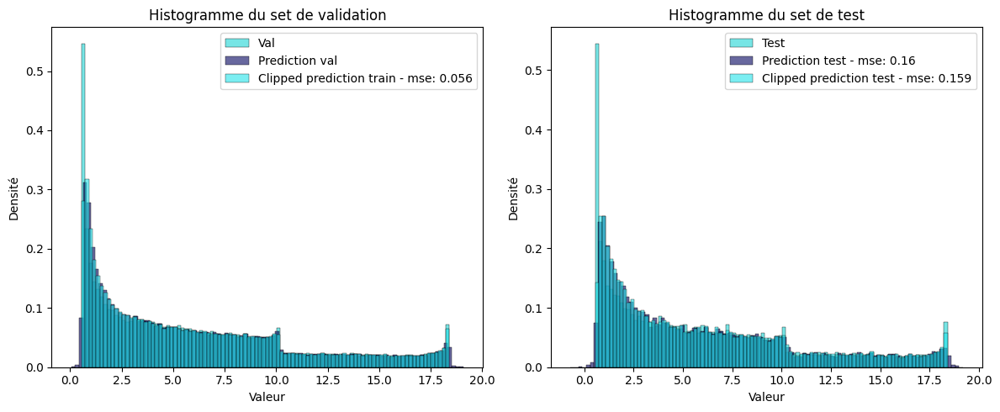

In [98]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

sns.histplot(y_train, bins=100, kde=False, color=colors[1], edgecolor='black', stat='density', alpha=0.6, ax=ax[0], label='Val')
sns.histplot(y_pred_train, bins=100, kde=False, color=colors[4], edgecolor='black', stat='density', alpha=0.6, ax=ax[0], label='Prediction val')
sns.histplot(y_pred_train_clipped, bins=100, kde=False, color=colors[0], edgecolor='black', stat='density', alpha=0.6, ax=ax[0], label=f'Clipped prediction train - mse: {round(mse_train_clipped,3)}')
ax[0].set_title('Histogramme du set de validation')
ax[0].set_xlabel('Valeur')
ax[0].set_ylabel('Densité')
ax[0].legend()


sns.histplot(y_test, bins=100, kde=False, color=colors[1], edgecolor='black', stat='density', alpha=0.6, ax=ax[1], label='Test')
sns.histplot(y_pred_test, bins=100, kde=False, color=colors[4], edgecolor='black', stat='density', alpha=0.6, ax=ax[1], label=f'Prediction test - mse: {round(mse_test,3)}')
sns.histplot(y_pred_test_clipped, bins=100, kde=False, color=colors[0], edgecolor='black', stat='density', alpha=0.6, ax=ax[1], label=f'Clipped prediction test - mse: {round(mse_test_clipped,3)}')
ax[1].set_title('Histogramme du set de test')
ax[1].set_xlabel('Valeur')
ax[1].set_ylabel('Densité')
ax[1].legend()

plt.tight_layout()
plt.show()

Limite du XGBoost:
Ne parvient pas à prédire la tail de la distribution

# With feature interactions from EDA

Worst result than with XGBoost only

In [144]:
params_constrained = best_model.get_params().copy()
params_constrained['interaction_constraints'] = '[[0,8,6], [1,2,4,6], [2,5], [3,5,7], [5,8], [7,9]]'

model = XGBRegressor(**params_constrained)

model.fit(X_train_val, y_train_val)

y_pred_train_val = model.predict(X_train_val)
y_pred_test = model.predict(X_test)
y_pred_train_val_clipped = np.clip(y_pred_train_val, np.min(target), np.max(target))
y_pred_test_clipped = np.clip(y_pred_test, np.min(target), np.max(target))

mse_train_val = mean_squared_error(y_train_val, y_pred_train_val)
mse_test = mean_squared_error(y_test, y_pred_test)
mse_train_val_clipped = mean_squared_error(y_train_val, y_pred_train_val_clipped)
mse_test_clipped = mean_squared_error(y_test, y_pred_test_clipped)

print(f'Mean Squared Error: {mse_train_val}')
print(f'Mean Squared Error: {mse_test}')
print(f'Mean Squared Error clipped: {mse_train_val_clipped}')
print(f'Mean Squared Error clipped: {mse_test_clipped}')

Mean Squared Error: 1.275509569671336
Mean Squared Error: 2.6598466313708524
Mean Squared Error clipped: 1.251925143818225
Mean Squared Error clipped: 2.5583445589943623


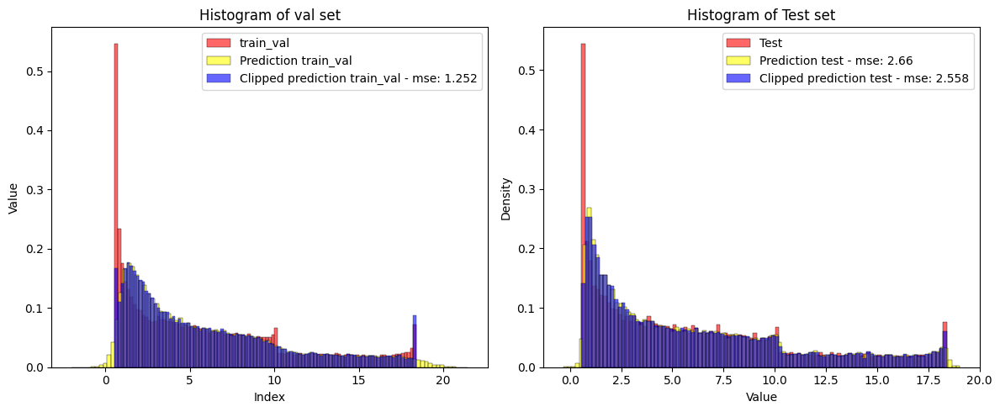

In [146]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

sns.histplot(y_train, bins=100, kde=False, color='red', edgecolor='black', stat='density', alpha=0.6, ax=ax[0], label='train_val')
sns.histplot(y_pred_train_val, bins=100, kde=False, color='yellow', edgecolor='black', stat='density', alpha=0.6, ax=ax[0], label='Prediction train_val')
sns.histplot(y_pred_train_val_clipped, bins=100, kde=False, color='blue', edgecolor='black', stat='density', alpha=0.6, ax=ax[0], label=f'Clipped prediction train_val - mse: {round(mse_train_val_clipped,3)}')
ax[0].set_title('Histogram of val set')
ax[0].set_xlabel('Index')
ax[0].set_ylabel('Value')
ax[0].legend()


sns.histplot(y_test, bins=100, kde=False, color='red', edgecolor='black', stat='density', alpha=0.6, ax=ax[1], label='Test')
sns.histplot(y_test_pred, bins=100, kde=False, color='yellow', edgecolor='black', stat='density', alpha=0.6, ax=ax[1], label=f'Prediction test - mse: {round(mse_test,3)}')
sns.histplot(y_test_pred_clipped, bins=100, kde=False, color='blue', edgecolor='black', stat='density', alpha=0.6, ax=ax[1], label=f'Clipped prediction test - mse: {round(mse_test_clipped,3)}')
ax[1].set_title('Histogram of Test set')
ax[1].set_xlabel('Value')
ax[1].set_ylabel('Density')
ax[1].legend()

plt.tight_layout()
plt.show()